In [1]:
import json
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import time
import re
import networkx as nx
from operator import itemgetter
import warnings
import matplotlib.cm as mcm
import community
from community import community_louvain as cm
import leidenalg as la
import igraph as ig
from cdlib import algorithms
import glob
warnings.filterwarnings('ignore')

In [2]:
path='/Users/marta/Desktop/Master/covid_19/files/'

In [3]:
def get_list_by_keyword(subject, keyword):
    list_by_key = []
    indices = [i for i, x in enumerate(subject.split()) if keyword in x]
    if len(indices) == 0:
        return None
    list_by_key = [None] * len(indices)
    for idx in range(len(indices)):
        list_by_key[idx] = subject.split()[int(indices[idx]+1)].replace("'", "").replace(",", "")
    return list_by_key

In [4]:
tweets_with_urls = pd.read_csv('/Users/marta/Desktop/Master/covid_19/files/users_credibility/tweets_with_urls_all_months.csv')
tweets_with_urls.head()

,id,id_str,created_at,user_id,user_screen_name,user_verified,user_created_at,text,source,coordinates,...,number_of_urls,domain,cred_counter,LOW,HIGH,UNKW,SOCIAL,user_tweets_count,user_friends_count,user_followers_count
0,1219753292571594754,1219753292571594752.0,Tue Jan 21 22:47:01 +0000 2020,33833239.0,IAmTonyaNash,False,Tue Apr 21 06:27:31 +0000 2009,PHAP gives future #publichealth professionals ...,"<a href=""http://twitter.com/#!/download/ipad"" ...",NaN,...,1.0,['go.usa.gov'],[0],0.0,0.0,1.0,0.0,NaN,NaN,NaN
1,1219769722171994112,1219769722171994112.0,Tue Jan 21 23:52:18 +0000 2020,545294451.0,AndiUgo,False,Wed Apr 04 15:27:00 +0000 2012,CDC announces first U.S. case of Chinese coron...,"<a href=""http://www.facebook.com/twitter"" rel=...",NaN,...,1.0,['globalnews.ca'],[0],0.0,0.0,1.0,0.0,NaN,NaN,NaN
2,1219747491265929217,1219747491265929216.0,Tue Jan 21 22:23:58 +0000 2020,15617333.0,wQQn,False,Sun Jul 27 04:00:05 +0000 2008,Coronavirus: health officials announce first k...,"<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,...,1.0,['theguardian.com'],[1],0.0,1.0,0.0,0.0,NaN,NaN,NaN
3,1219751937089949696,1219751937089949696.0,Tue Jan 21 22:41:38 +0000 2020,2232530184.0,CDC_Plays,False,Fri Dec 06 06:17:48 +0000 2013,For my sister\n\nRead: https://t.co/WzmBMkIFcg,"<a href=""http://twitter.com/download/android"" ...",NaN,...,1.0,['tl.gd'],[0],0.0,0.0,1.0,0.0,NaN,NaN,NaN
4,1219748239123062784,1219748239123062784.0,Tue Jan 21 22:26:56 +0000 2020,730969006253858816.0,PDerek56,False,Fri May 13 03:52:46 +0000 2016,Deadly new virus in China has reached the U.S....,"<a href=""http://twitter.com/download/iphone"" r...",NaN,...,1.0,['gizmo.do'],[0],0.0,0.0,1.0,0.0,NaN,NaN,NaN


In [7]:
#marta
replies = tweets_with_urls.dropna(subset=['in_reply_to_user_id'])
original_tweets = tweets_with_urls[tweets_with_urls[['rt_created_at', 'in_reply_to_user_id']].isna().all(1)]
replies_and_original_with_urls = 

In [6]:
#Gianluca
replies = tweets_with_urls[tweets_with_urls["in_reply_to_user_id"].notna() & tweets_with_urls["quoted_status_id"].isna()]
original_tweets = tweets_with_urls[tweets_with_urls["in_reply_to_screen_name"].isna() & tweets_with_urls["rt_created_at"].isna() & tweets_with_urls["quoted_status_id"].isna()]
replies_and_original_with_urls = pd.concat([replies, original_tweets], ignore_index=True, sort=False)

In [7]:
print('Tweets with urls: ', len(tweets_with_urls))
print('Original tweets and replies with urls: ', len(replies_and_original_with_urls))

Tweets with urls:  18910298
Original tweets and replies with urls:  8856933


In [8]:
sum_of_urls_df = replies_and_original_with_urls.groupby(['user_screen_name'])[['number_of_urls','HIGH','LOW','UNKW','SOCIAL']].sum()
sum_of_urls_df=sum_of_urls_df.sort_values(by=['number_of_urls'], ascending=False)
sum_of_urls_df.head(10)

,number_of_urls,HIGH,LOW,UNKW,SOCIAL
user_screen_name,,,,,
poandpo,6117.0,0.0,0.0,6117.0,0.0
infoitinterno,5503.0,0.0,0.0,5503.0,0.0
AndyVermaut,5116.0,823.0,64.0,4199.0,30.0
openletterbot,3913.0,0.0,0.0,3.0,3910.0
dev_discourse,3836.0,0.0,0.0,3836.0,0.0
chorleychicken,3744.0,446.0,0.0,3298.0,0.0
nonsellcom,3684.0,1.0,15.0,3667.0,1.0
AnalyticaGlobal,3639.0,1724.0,194.0,1659.0,62.0
contrapuntovzla,3386.0,0.0,0.0,3386.0,0.0


In [9]:
sum_of_urls_df.to_csv(path+'users_credibility/sum_of_urls_df_original_replies_modified.csv')

In [5]:
sum_of_urls_df = pd.read_csv(path+'users_credibility/sum_of_urls_df_original_replies_modified.csv')

In [10]:
#sum_of_urls_df['conspiracy_score'] = np.around((sum_of_urls_df['LOW'] /(sum_of_urls_df['number_of_urls']-sum_of_urls_df['UNKW']-sum_of_urls_df['SOCIAL'])),2)
sum_of_urls_df['conspiracy_score'] = np.around(((sum_of_urls_df['LOW'])/(sum_of_urls_df['LOW']+sum_of_urls_df['HIGH'])),2)
#sum_of_urls_df['conspiracy_score'] = np.around(((sum_of_urls_df['LOW'])/(sum_of_urls_df['number_of_urls'])))
sum_of_urls_df=sum_of_urls_df.sort_values(by=['conspiracy_score'], ascending=False)
sum_of_urls_df.head(10)

,number_of_urls,HIGH,LOW,UNKW,SOCIAL,conspiracy_score
user_screen_name,,,,,,
SelfCleanAir,3.0,0.0,1.0,2.0,0.0,1.0
kmcclee,1.0,0.0,1.0,0.0,0.0,1.0
danyellgear,1.0,0.0,1.0,0.0,0.0,1.0
densyo007,1.0,0.0,1.0,0.0,0.0,1.0
zsuzisusuz,4.0,0.0,1.0,3.0,0.0,1.0
degrabo20,1.0,0.0,1.0,0.0,0.0,1.0
hzorrkhkydymvfr,1.0,0.0,1.0,0.0,0.0,1.0
cgavicc,3.0,0.0,3.0,0.0,0.0,1.0
geralynann,2.0,0.0,1.0,1.0,0.0,1.0


In [11]:
sum_of_urls_df.to_csv(path+'users_credibility/sum_of_urls_df_original_replies_with_score_modified.csv')

In [3]:
sum_of_urls_df = pd.read_csv(path+'users_credibility/sum_of_urls_df_original_replies_with_score_modified.csv')

In [9]:
print(len(sum_of_urls_df))
threshold_high_low = 10
sum_of_urls_df_10 = sum_of_urls_df[sum_of_urls_df['HIGH']+sum_of_urls_df['LOW']>=threshold_high_low]
print(len(sum_of_urls_df_10))

1687531
14520


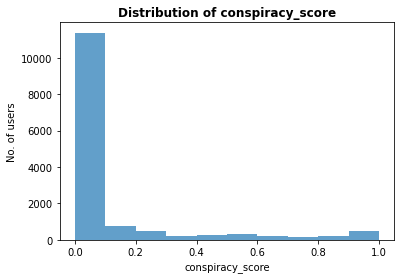

In [13]:
# distribution of scores
plt.hist(list(sum_of_urls_df_10['conspiracy_score']), bins=10, alpha=0.7)
plt.xlabel('conspiracy_score')
plt.ylabel('No. of users')
plt.title('Distribution of conspiracy_score', weight='bold')
#plt.yscale('log')
#plt.savefig('plots/dist', bbox_inches='tight')
plt.show()

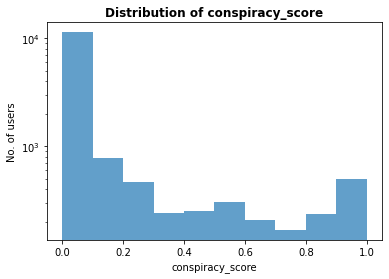

In [14]:
# distribution of scores
plt.hist(list(sum_of_urls_df_10['conspiracy_score']), bins=10, alpha=0.7)
plt.xlabel('conspiracy_score')
plt.ylabel('No. of users')
plt.title('Distribution of conspiracy_score', weight='bold')
plt.yscale('log')
#plt.savefig('plots/dist', bbox_inches='tight')
plt.show()

In [4]:
good_dozen = pd.read_csv(path+'users_credibility/300_good_users.csv')
good_dozen.head()

,screen_name
0,HelenBranswell
1,mlipsitch
2,trvrb
3,kakape
4,JeremyFarrar


In [16]:
len(good_dozen)

350

In [5]:
bad_dozen = pd.read_csv(path+'users_credibility/disinformation_users.csv')
bad_dozen.head()

,screen_name,status
0,mercola,active
1,RobertKennedyJr,active
2,TyCharleneB,removed
3,BusyDrT,suspended
4,IslamRizza,removed


In [10]:
sum_of_urls_df_10.reset_index(level=0, inplace=True)
sum_of_urls_df_10.head()

,index,user_screen_name,number_of_urls,HIGH,LOW,UNKW,SOCIAL,conspiracy_score
0,55,DeborahJFischer,18.0,0.0,11.0,7.0,0.0,1.0
1,112,giuseppesimonc4,18.0,0.0,18.0,0.0,0.0,1.0
2,129,21WIRE,18.0,0.0,15.0,3.0,0.0,1.0
3,238,KSSRoberts,19.0,0.0,17.0,2.0,0.0,1.0
4,243,DaveLovesGod,19.0,0.0,19.0,0.0,0.0,1.0


In [11]:
high_cred_users = sum_of_urls_df_10[sum_of_urls_df_10['conspiracy_score']==0]['user_screen_name']
low_cred_users = sum_of_urls_df_10[sum_of_urls_df_10['conspiracy_score']>=0.5]['user_screen_name']

In [20]:
print(len(high_cred_users))
print(len(low_cred_users))

9820
1415


In [12]:
good_users = high_cred_users.append(good_dozen['screen_name'], ignore_index=True)
bad_users = low_cred_users.append(bad_dozen['screen_name'], ignore_index=True)
print(len(good_users))
print(len(bad_users))
good_users.drop_duplicates(inplace=True)
bad_users.drop_duplicates(inplace=True)
print(len(good_users))
print(len(bad_users))

10170
1427
10099
1427


In [13]:
bad_users_array = bad_users.values
good_users_array = good_users.values

In [227]:
months=5
tweets_df = [None]*months
for i in range(months):
    tweets_df[i] = pd.read_csv(path+'COVID-19-Tweets/2020-0'+str(i+1)+'/tweets.csv', lineterminator='\n')

In [13]:
tweets = pd.concat(tweets_df)

In [14]:
bad_followers_tweets = tweets[tweets['rt_user_screen_name'].isin(bad_users_array)]

In [ ]:
good_followers_tweets = tweets[tweets['rt_user_screen_name'].isin(good_users_array)]

Error: Session cannot generate requests

In [28]:
bad_followers_tweets['bad_or_good'] = 'bad'
good_followers_tweets['bad_or_good'] = 'good'

In [29]:
all_followers_tweets = pd.concat([bad_followers_tweets, good_followers_tweets], ignore_index=True)

In [30]:
followers_tweets_grouped = all_followers_tweets.groupby(['user_screen_name', 'bad_or_good']).size().reset_index(name='counts')

In [31]:
bad_or_good_df = pd.pivot_table(followers_tweets_grouped, values='counts', index=['user_screen_name'],
                    columns=['bad_or_good'], aggfunc=np.sum, fill_value=0)

In [32]:
bad_or_good_df = bad_or_good_df.reset_index()
bad_or_good_df.rename_axis(None)
bad_or_good_df.head()

bad_or_good,user_screen_name,bad,good
0,000000000aeaM,0,7
1,0000000p0000,0,2
2,00000365,0,33
3,00000__b,0,1
4,00000o0OOOO00,0,4


In [33]:
bad_or_good_df.to_csv(path+'users_credibility/bad_or_good_df_original_replies_modified.csv', index=False)

In [14]:
bad_or_good_df = pd.read_csv(path+'users_credibility/bad_or_good_df_original_replies_modified.csv')

In [15]:
bad_or_good_df['retweet_ratio'] = np.around(((bad_or_good_df['bad'])/(bad_or_good_df['bad']+bad_or_good_df['good'])),2)
#sum_of_urls_df['conspiracy_score'] = np.around(((sum_of_urls_df['LOW'])/(sum_of_urls_df['number_of_urls'])))
bad_or_good_df=bad_or_good_df.sort_values(by=['retweet_ratio'], ascending=False)
bad_or_good_df.head(10)

,user_screen_name,bad,good,retweet_ratio
552392,Twittter_Suks,1,0,1.0
959360,maximax9,1,0,1.0
92447,CAF1LLC,2,0,1.0
92444,CAESAR27BC,7,0,1.0
401859,Nicola_Leone_BI,3,0,1.0
1132850,subble07,1,0,1.0
283579,JustJolene20,1,0,1.0
1132860,subdialectsound,1,0,1.0
707854,collins_olisa,1,0,1.0
707876,collinz022,1,0,1.0


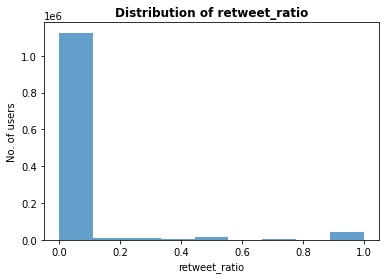

In [35]:
# distribution of scores
plt.hist(list(bad_or_good_df['retweet_ratio']), bins=9, alpha=0.7)
plt.xlabel('retweet_ratio')
plt.ylabel('No. of users')
plt.title('Distribution of retweet_ratio', weight='bold')
#plt.savefig('plots/dist', bbox_inches='tight')
plt.show()

In [16]:
threshold_bad_good = 10
bad_or_good_df_10 = bad_or_good_df[bad_or_good_df['bad']+bad_or_good_df['good']>=threshold_bad_good]

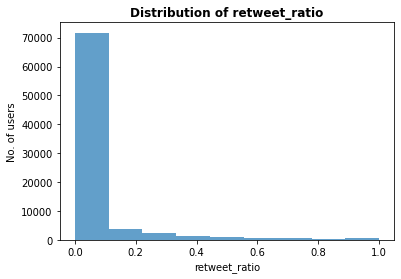

In [37]:
# distribution of scores
plt.hist(list(bad_or_good_df_10['retweet_ratio']), bins=9, alpha=0.7)
plt.xlabel('retweet_ratio')
plt.ylabel('No. of users')
plt.title('Distribution of retweet_ratio', weight='bold')
#plt.savefig('plots/dist', bbox_inches='tight')
plt.show()

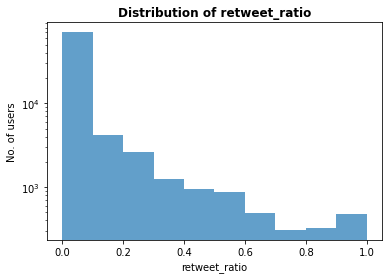

In [38]:
# distribution of scores
plt.hist(list(bad_or_good_df_10['retweet_ratio']), bins=10, alpha=0.7)
plt.xlabel('retweet_ratio')
plt.ylabel('No. of users')
plt.title('Distribution of retweet_ratio', weight='bold')
plt.yscale('log')
#plt.savefig('plots/dist', bbox_inches='tight')
plt.show()

In [17]:
users_good = bad_or_good_df_10[bad_or_good_df_10['retweet_ratio']==0].user_screen_name.unique()
users_bad = bad_or_good_df_10[bad_or_good_df_10['retweet_ratio']>=0.5].user_screen_name.unique()

In [40]:
print('Users with retweet ratio=0 :',len(users_good),', ',np.around(len(users_good)*100/(len(users_good)+len(users_bad)),2),'%')
print('Users with retweet ratio>=0.5 :',len(users_bad),', ',np.around(len(users_bad)*100/(len(users_good)+len(users_bad)),2),'%')

Users with retweet ratio=0 : 57138 ,  95.87 %
Users with retweet ratio>=0.5 : 2464 ,  4.13 %


In [41]:
retweets = tweets.dropna(subset=['rt_created_at'])

In [42]:
replies = tweets.dropna(subset=['in_reply_to_user_id'])

In [43]:
original_tweets = tweets[tweets[['rt_created_at', 'in_reply_to_user_id']].isna().all(1)]

In [44]:
good_retweets = retweets[retweets['user_screen_name'].isin(users_good)]
print('Retweets made by good users: ',len(good_retweets),', ',np.around(len(good_retweets)*100/len(retweets),2),'%')

Retweets made by good users:  5449512 ,  11.28 %


In [45]:
bad_retweets = retweets[retweets['user_screen_name'].isin(users_bad)]
print('Retweets made by bad users: ',len(bad_retweets),', ',np.around(len(bad_retweets)*100/len(retweets),2),'%')

Retweets made by bad users:  270285 ,  0.56 %


In [35]:
print('Retweets made by good users: ',len(good_retweets),', ',np.around(len(good_retweets)*100/(len(good_retweets)+len(bad_retweets)),2),'%')
print('Retweets made by bad users: ',len(bad_retweets),', ',np.around(len(bad_retweets)*100/(len(good_retweets)+len(bad_retweets)),2),'%')

Retweets made by good users:  5471344 ,  95.29 %
Retweets made by bad users:  270714 ,  4.71 %


In [36]:
good_retweeted = retweets[retweets['rt_user_screen_name'].isin(users_good)]
print('Retweets to good users: ',len(good_retweeted),', ',np.around(len(good_retweeted)*100/len(retweets),2),'%')

Retweets to good users:  3637374 ,  7.53 %


In [37]:
bad_retweeted = retweets[retweets['rt_user_screen_name'].isin(users_bad)]
print('Retweets to bad users: ',len(bad_retweeted),', ',np.around(len(bad_retweeted)*100/len(retweets),2),'%')

Retweets to bad users:  148585 ,  0.31 %


In [38]:
print('Retweets to good users: ',len(good_retweeted),', ',np.around(len(good_retweeted)*100/(len(good_retweeted)+len(bad_retweeted)),2),'%')
print('Retweets to bad users: ',len(bad_retweeted),', ',np.around(len(bad_retweeted)*100/(len(good_retweeted)+len(bad_retweeted)),2),'%')

Retweets to good users:  3637374 ,  96.08 %
Retweets to bad users:  148585 ,  3.92 %


In [39]:
good_replies = replies[replies['user_screen_name'].isin(users_good)]
print('Replies made by good users: ',len(good_replies),', ',np.around(len(good_replies)*100/len(replies),2),'%')

Replies made by good users:  181950 ,  3.96 %


In [40]:
bad_replies = replies[replies['user_screen_name'].isin(users_bad)]
print('Replies made by bad users: ',len(bad_replies),', ',np.around(len(bad_replies)*100/len(replies),2),'%')

Replies made by bad users:  8411 ,  0.18 %


In [41]:
print('Replies made by good users: ',len(good_replies),', ',np.around(len(good_replies)*100/(len(good_replies)+len(bad_replies)),2),'%')
print('Replies made by bad users: ',len(bad_replies),', ',np.around(len(bad_replies)*100/(len(good_replies)+len(bad_replies)),2),'%')

Replies made by good users:  181950 ,  95.58 %
Replies made by bad users:  8411 ,  4.42 %


In [42]:
good_replied = replies[replies['in_reply_to_screen_name'].isin(users_good)]
print('Replies to good users: ',len(good_replied),', ',np.around(len(good_replied)*100/len(replies),2),'%')

Replies to good users:  263980 ,  5.74 %


In [43]:
bad_replied = replies[replies['in_reply_to_screen_name'].isin(users_bad)]
print('Replies to bad users: ',len(bad_replied),', ',np.around(len(bad_replied)*100/len(replies),2),'%')

Replies to bad users:  8599 ,  0.19 %


In [44]:
print('Replies to good users: ',len(good_replied),', ',np.around(len(good_replied)*100/(len(good_replied)+len(bad_replied)),2),'%')
print('Replies to bad users: ',len(bad_replied),', ',np.around(len(bad_replied)*100/(len(good_replied)+len(bad_replied)),2),'%')

Replies to good users:  263980 ,  96.85 %
Replies to bad users:  8599 ,  3.15 %


In [45]:
good_original_tweets = original_tweets[original_tweets['user_screen_name'].isin(users_good)]
print('Original tweets made by good users: ',len(good_original_tweets),', ',np.around(len(good_original_tweets)*100/len(original_tweets),2),'%')

Original tweets made by good users:  501940 ,  3.72 %


In [46]:
bad_original_tweets = original_tweets[original_tweets['user_screen_name'].isin(users_bad)]
print('Original tweets made by bad users: ',len(bad_original_tweets),', ',np.around(len(bad_original_tweets)*100/len(original_tweets),2),'%')

Original tweets made by bad users:  37445 ,  0.28 %


In [47]:
print('Original tweets made by good users: ',len(good_original_tweets),', ',np.around(len(good_original_tweets)*100/(len(good_original_tweets)+len(bad_original_tweets)),2),'%')
print('Original tweets made by bad users: ',len(bad_original_tweets),', ',np.around(len(bad_original_tweets)*100/(len(good_original_tweets)+len(bad_original_tweets)),2),'%')

Original tweets made by good users:  501940 ,  93.06 %
Original tweets made by bad users:  37445 ,  6.94 %


# Remove good and bad from df

In [21]:
good_df = bad_or_good_df_10[bad_or_good_df_10['user_screen_name'].isin(good_users_array)]
bad_df = bad_or_good_df_10[bad_or_good_df_10['user_screen_name'].isin(bad_users_array)]

In [22]:
print(len(good_df))
print(len(bad_df))

3350
399


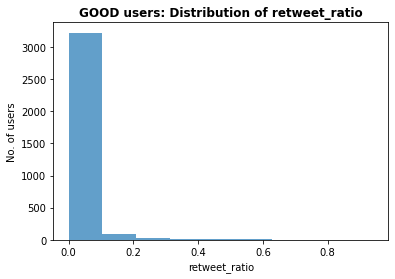

In [66]:
# distribution of scores
plt.hist(list(good_df['retweet_ratio']), bins=9, alpha=0.7)
plt.xlabel('retweet_ratio')
plt.ylabel('No. of users')
plt.title('GOOD users: Distribution of retweet_ratio', weight='bold')
#plt.savefig('plots/dist', bbox_inches='tight')
plt.show()

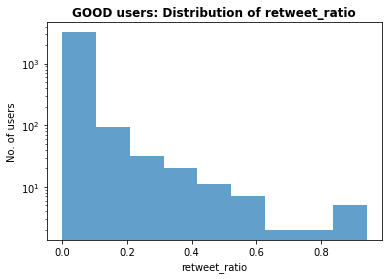

In [69]:
# distribution of scores
plt.hist(list(good_df['retweet_ratio']), bins=9, alpha=0.7)
plt.xlabel('retweet_ratio')
plt.ylabel('No. of users')
plt.title('GOOD users: Distribution of retweet_ratio', weight='bold')
plt.yscale('log')
#plt.savefig('plots/dist', bbox_inches='tight')
plt.show()

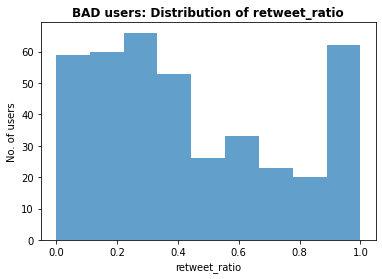

In [67]:
# distribution of scores
plt.hist(list(bad_df['retweet_ratio']), bins=9, alpha=0.7)
plt.xlabel('retweet_ratio')
plt.ylabel('No. of users')
plt.title('BAD users: Distribution of retweet_ratio', weight='bold')
#plt.savefig('plots/dist', bbox_inches='tight')
plt.show()

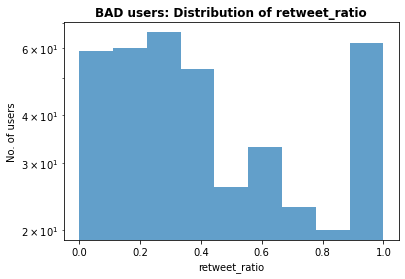

In [70]:
# distribution of scores
plt.hist(list(bad_df['retweet_ratio']), bins=9, alpha=0.7)
plt.xlabel('retweet_ratio')
plt.ylabel('No. of users')
plt.title('BAD users: Distribution of retweet_ratio', weight='bold')
plt.yscale('log')
#plt.savefig('plots/dist', bbox_inches='tight')
plt.show()

In [24]:
merge_conspiracy_retweet_df = pd.merge(sum_of_urls_df_10,bad_or_good_df_10,on='user_screen_name')

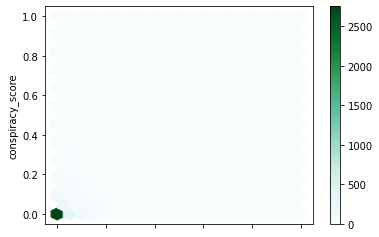

In [25]:
ax = merge_conspiracy_retweet_df.plot.hexbin(x='retweet_ratio', y='conspiracy_score', gridsize=20)

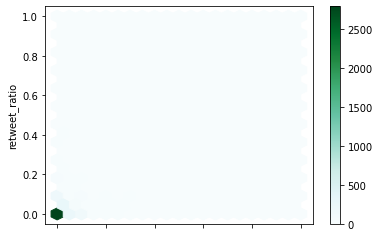

In [47]:
ax = merge_conspiracy_retweet_df.plot.hexbin(x='conspiracy_score', y='retweet_ratio', gridsize=20)

In [30]:
good_df = good_df[good_df['retweet_ratio']==0] #remove "good" users with rt_ratio >0.0

In [67]:
good_users_rt_0 = good_df['user_screen_name'].values #good users are good dozen 
good_users_rt_0

array(['holybullies', 'grumblecore', 'kidcue', ..., 'ParkingReview',
       'PartnersfrLife', 'PatrickTineo24'], dtype=object)

In [68]:
len(good_users_rt_0) #good users which have a retweet ratio == 0.0

2481

In [69]:
good_users_rt_0

array(['holybullies', 'grumblecore', 'kidcue', ..., 'ParkingReview',
       'PartnersfrLife', 'PatrickTineo24'], dtype=object)

In [32]:
bad_or_good_df = pd.concat([good_df, bad_df], ignore_index=True, sort=False)

In [33]:
bad_or_good_df_tmp = bad_or_good_df[~bad_or_good_df['user_screen_name'].isin(bad_users_array)]
bad_or_good_df_modified = bad_or_good_df_tmp[~bad_or_good_df_tmp['user_screen_name'].isin(good_users_array)]

In [34]:
print(len(bad_or_good_df))
print(len(bad_or_good_df_tmp))
print(len(bad_or_good_df_modified))

2880
2481
0


In [42]:
outer_join_conspiracy_retweet = pd.merge(sum_of_urls_df_10,bad_or_good_df_10,on='user_screen_name',how='outer')

In [45]:
len(outer_join_conspiracy_retweet)

91327

In [52]:
good_users_outer_join_1_df = outer_join_conspiracy_retweet[(outer_join_conspiracy_retweet['retweet_ratio'].isna() & outer_join_conspiracy_retweet['conspiracy_score']==0)]
print(len(good_users_outer_join_1_df))
good_users_outer_join_2_df = outer_join_conspiracy_retweet[(outer_join_conspiracy_retweet['retweet_ratio']==0 & outer_join_conspiracy_retweet['conspiracy_score'].isna())]
print(len(good_users_outer_join_2_df))

88242
57138


In [65]:
good_users_outer_join_1 = good_users_outer_join_1_df['user_screen_name']
good_users_outer_join_2 = good_users_outer_join_2_df['user_screen_name']

good_users = good_users_outer_join_1.append(good_users_outer_join_2 , ignore_index=True)
print(len(good_users))
good_users.drop_duplicates(inplace=True)
print(len(good_users))

good_users_array_tmp = good_users.values

145380
88242


In [76]:
good_dozen_not_in_outer_join_df = outer_join_conspiracy_retweet[(outer_join_conspiracy_retweet['retweet_ratio'].notna() & outer_join_conspiracy_retweet['conspiracy_score'].notna())]
good_dozen_not_in_outer_join = good_dozen_not_in_outer_join_df[good_dozen_not_in_outer_join_df['user_screen_name'].isin(good_dozen)]['user_screen_name']
len(good_dozen_not_in_outer_join)

0

In [77]:
#users with:
# - conspiracy_score = 0 and rt_ratio nan or
# - conspiracy_score nan and rt_ratio 0 or
# - conspiracy_score nan and rt_ratio nan and belonging to good_dozen
good_users_array = list(set(list(good_users_array_tmp) + list(good_dozen_not_in_outer_join))) 
len(good_users_array)

88242

In [79]:
bad_users_outer_join_df = outer_join_conspiracy_retweet[(outer_join_conspiracy_retweet['retweet_ratio']>=0.5) | (outer_join_conspiracy_retweet['conspiracy_score']>=0.5)]
print(len(bad_users_outer_join_df))

3727


In [82]:
#users with:
# - conspiracyscore >= 0.5 or
# - rt_ratio >= 0.5 or
# - belonging to bad_dozen
bad_users_outer_join = bad_users_outer_join_df['user_screen_name'].values

bad_users_array = list(set(list(bad_users_outer_join) + list(bad_dozen)))
len(bad_users_array)

3729

In [54]:
threshold_bad_good = 10
bad_or_good_df_modified_10 = bad_or_good_df_modified[bad_or_good_df_modified['bad']+bad_or_good_df_modified['good']>=threshold_bad_good]

In [55]:
print(len(bad_or_good_df_modified_10))

78334


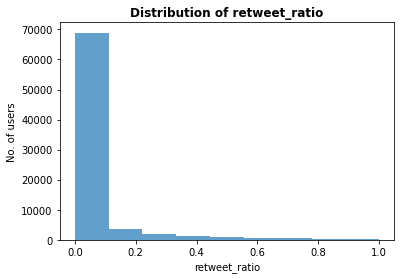

In [56]:
# distribution of scores
plt.hist(list(bad_or_good_df_modified_10['retweet_ratio']), bins=9, alpha=0.7)
plt.xlabel('retweet_ratio')
plt.ylabel('No. of users')
plt.title('Distribution of retweet_ratio', weight='bold')
#plt.savefig('plots/dist', bbox_inches='tight')
plt.show()

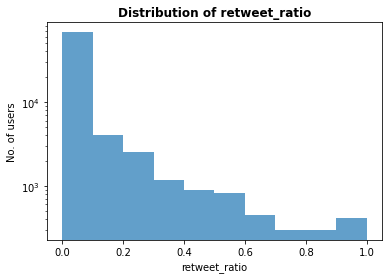

In [57]:
# distribution of scores
plt.hist(list(bad_or_good_df_modified_10['retweet_ratio']), bins=10, alpha=0.7)
plt.xlabel('retweet_ratio')
plt.ylabel('No. of users')
plt.title('Distribution of retweet_ratio', weight='bold')
plt.yscale('log')
#plt.savefig('plots/dist', bbox_inches='tight')
plt.show()

In [71]:
users_good_modified = bad_or_good_df_modified_10[bad_or_good_df_modified_10['retweet_ratio']==0].user_screen_name.unique()
users_bad_modified = bad_or_good_df_modified_10[bad_or_good_df_modified_10['retweet_ratio']>=0.5].user_screen_name.unique()

In [73]:
print('Users with retweet ratio=0 :',len(users_good_modified),', ',np.around(len(users_good_modified)*100/(len(users_good_modified)+len(users_bad_modified)),2),'%')
print('Users with retweet ratio>=0.5 :',len(users_bad_modified),', ',np.around(len(users_bad_modified)*100/(len(users_good_modified)+len(users_bad_modified)),2),'%')

Users with retweet ratio=0 : 55045 ,  96.0 %
Users with retweet ratio>=0.5 : 2296 ,  4.0 %


In [74]:
good_retweets_m = retweets[retweets['user_screen_name'].isin(users_good_modified)]
print('Retweets made by good users: ',len(good_retweets_m),', ',np.around(len(good_retweets_m)*100/len(retweets),2),'%')

Retweets made by good users:  5183330 ,  10.73 %


In [76]:
bad_retweets_m = retweets[retweets['user_screen_name'].isin(users_bad_modified)]
print('Retweets made by bad users: ',len(bad_retweets_m),', ',np.around(len(bad_retweets_m)*100/len(retweets),2),'%')

Retweets made by bad users:  250117 ,  0.52 %


In [77]:
print('Retweets made by good users: ',len(good_retweets_m),', ',np.around(len(good_retweets_m)*100/(len(good_retweets_m)+len(bad_retweets_m)),2),'%')
print('Retweets made by bad users: ',len(bad_retweets_m),', ',np.around(len(bad_retweets_m)*100/(len(good_retweets_m)+len(bad_retweets_m)),2),'%')

Retweets made by good users:  5183330 ,  95.4 %
Retweets made by bad users:  250117 ,  4.6 %


In [78]:
good_retweeted_m = retweets[retweets['rt_user_screen_name'].isin(users_good_modified)]
print('Retweets to good users: ',len(good_retweeted_m),', ',np.around(len(good_retweeted_m)*100/len(retweets),2),'%')

Retweets to good users:  1501925 ,  3.11 %


In [79]:
bad_retweeted_m = retweets[retweets['rt_user_screen_name'].isin(users_bad_modified)]
print('Retweets to bad users: ',len(bad_retweeted_m),', ',np.around(len(bad_retweeted_m)*100/len(retweets),2),'%')

Retweets to bad users:  80944 ,  0.17 %


In [80]:
print('Retweets to good users: ',len(good_retweeted_m),', ',np.around(len(good_retweeted_m)*100/(len(good_retweeted_m)+len(bad_retweeted_m)),2),'%')
print('Retweets to bad users: ',len(bad_retweeted_m),', ',np.around(len(bad_retweeted_m)*100/(len(good_retweeted_m)+len(bad_retweeted_m)),2),'%')

Retweets to good users:  1501925 ,  94.89 %
Retweets to bad users:  80944 ,  5.11 %


In [81]:
good_replies_m = replies[replies['user_screen_name'].isin(users_good_modified)]
print('Replies made by good users: ',len(good_replies_m),', ',np.around(len(good_replies_m)*100/len(replies),2),'%')

Replies made by good users:  151311 ,  3.29 %


In [82]:
bad_replies_m = replies[replies['user_screen_name'].isin(users_bad_modified)]
print('Replies made by bad users: ',len(bad_replies_m),', ',np.around(len(bad_replies_m)*100/len(replies),2),'%')

Replies made by bad users:  6503 ,  0.14 %


In [83]:
print('Replies made by good users: ',len(good_replies_m),', ',np.around(len(good_replies_m)*100/(len(good_replies_m)+len(bad_replies_m)),2),'%')
print('Replies made by bad users: ',len(bad_replies_m),', ',np.around(len(bad_replies_m)*100/(len(good_replies_m)+len(bad_replies_m)),2),'%')

Replies made by good users:  151311 ,  95.88 %
Replies made by bad users:  6503 ,  4.12 %


In [84]:
good_replied_m = replies[replies['in_reply_to_screen_name'].isin(users_good_modified)]
print('Replies to good users: ',len(good_replied_m),', ',np.around(len(good_replied_m)*100/len(replies),2),'%')

Replies to good users:  109540 ,  2.38 %


In [86]:
bad_replied_m = replies[replies['in_reply_to_screen_name'].isin(users_bad_modified)]
print('Replies to bad users: ',len(bad_replied_m),', ',np.around(len(bad_replied_m)*100/len(replies),2),'%')

Replies to bad users:  5112 ,  0.11 %


In [87]:
print('Replies to good users: ',len(good_replied_m),', ',np.around(len(good_replied_m)*100/(len(good_replied_m)+len(bad_replied_m)),2),'%')
print('Replies to bad users: ',len(bad_replied_m),', ',np.around(len(bad_replied_m)*100/(len(good_replied_m)+len(bad_replied_m)),2),'%')

Replies to good users:  109540 ,  95.54 %
Replies to bad users:  5112 ,  4.46 %


In [88]:
good_original_tweets_m = original_tweets[original_tweets['user_screen_name'].isin(users_good_modified)]
print('Original tweets made by good users: ',len(good_original_tweets_m),', ',np.around(len(good_original_tweets_m)*100/len(original_tweets),2),'%')

Original tweets made by good users:  342239 ,  2.53 %


In [89]:
bad_original_tweets_m = original_tweets[original_tweets['user_screen_name'].isin(users_bad_modified)]
print('Original tweets made by bad users: ',len(bad_original_tweets_m),', ',np.around(len(bad_original_tweets_m)*100/len(original_tweets),2),'%')

Original tweets made by bad users:  20691 ,  0.15 %


In [90]:
print('Original tweets made by good users: ',len(good_original_tweets_m),', ',np.around(len(good_original_tweets_m)*100/(len(good_original_tweets_m)+len(bad_original_tweets_m)),2),'%')
print('Original tweets made by bad users: ',len(bad_original_tweets_m),', ',np.around(len(bad_original_tweets_m)*100/(len(good_original_tweets_m)+len(bad_original_tweets_m)),2),'%')

Original tweets made by good users:  342239 ,  94.3 %
Original tweets made by bad users:  20691 ,  5.7 %


# Retweet network

In [3]:
path_degrees = glob.glob(path+'Retweet Network/big_net/*degree*.json')
path_communities = glob.glob(path+'Retweet Network/big_net/*communities*.json')

In [4]:
start_time = time.perf_counter()
file = open (path_degrees[0],)
degree = json.loads(file.read())
file.close()
stop_time = time.perf_counter()
print("Time: ",stop_time-start_time)

Time:  10.415896919999994


In [5]:
start_time = time.perf_counter()
file = open (path_communities[1],)
louvain = json.loads(file.read())
file.close()
stop_time = time.perf_counter()
print("Time: ",stop_time-start_time)

Time:  13.831032977000007


In [6]:
size = float(len(set(louvain.values())))
print("Number of communities: ", size)

Number of communities:  325073.0


In [7]:
#check that sum of each community size = number of nodes
communities_size = np.zeros(len(set(louvain.values())))
for v in list(louvain.values()):
    communities_size[v] +=1
print(sum(communities_size))

12513502.0


In [8]:
communities_size_sorted_idx = np.argsort(communities_size)[::-1][:len(communities_size)]

In [89]:
for s in (communities_size_sorted_idx):
    print(f'Community {s} has size {int(communities_size[s])}')

Community 5 has size 1687953
Community 0 has size 1516564
Community 1 has size 1142470
Community 2 has size 1036651
Community 11 has size 725867
Community 10 has size 703335
Community 6 has size 685690
Community 14 has size 612418
Community 19 has size 607295
Community 9 has size 585305
Community 23 has size 431360
Community 15 has size 417021
Community 21 has size 284811
Community 3 has size 232970
Community 25 has size 181797
Community 7 has size 123896
Community 27 has size 104036
Community 16 has size 82032
Community 32 has size 81789
Community 83 has size 67922
Community 48 has size 58314
Community 8 has size 54545
Community 4 has size 49737
Community 108 has size 41472
Community 30 has size 40386
Community 39 has size 39767
Community 12 has size 36017
Community 178 has size 18459
Community 259 has size 14613
Community 62 has size 13963
Community 416 has size 11981
Community 46 has size 8817
Community 45 has size 8096
Community 24 has size 7191
Community 57 has size 5916
Community

In [90]:
sum_of_urls_df_10 = sum_of_urls_df_10.iloc[: , 1:]
sum_of_urls_df_10.head()

,user_screen_name,number_of_urls,HIGH,LOW,UNKW,SOCIAL,conspiracy_score
0,DeborahJFischer,18.0,0.0,11.0,7.0,0.0,1.0
1,giuseppesimonc4,18.0,0.0,18.0,0.0,0.0,1.0
2,21WIRE,18.0,0.0,15.0,3.0,0.0,1.0
3,KSSRoberts,19.0,0.0,17.0,2.0,0.0,1.0
4,DaveLovesGod,19.0,0.0,19.0,0.0,0.0,1.0


In [91]:
users_cred = sum_of_urls_df_10

In [92]:
users_cred['user_community'] = users_cred['user_screen_name'].map(louvain)

In [93]:
users_cred[users_cred['conspiracy_score']==1].dropna(subset=['user_community'])

,user_screen_name,number_of_urls,HIGH,LOW,UNKW,SOCIAL,conspiracy_score,user_community
0,DeborahJFischer,18.0,0.0,11.0,7.0,0.0,1.0,2.0
2,21WIRE,18.0,0.0,15.0,3.0,0.0,1.0,2.0
3,KSSRoberts,19.0,0.0,17.0,2.0,0.0,1.0,2.0
5,sunoveristambul,19.0,0.0,10.0,6.0,3.0,1.0,2.0
7,Freecanuck1,18.0,0.0,11.0,5.0,2.0,1.0,2.0
...,...,...,...,...,...,...,...,...
283,SilenceNotGold,31.0,0.0,10.0,14.0,7.0,1.0,2.0
285,1111Liberty,31.0,0.0,22.0,9.0,0.0,1.0,2.0
286,KDaures,102.0,0.0,102.0,0.0,0.0,1.0,2.0
287,GroundsGalen123,114.0,0.0,20.0,67.0,27.0,1.0,2.0


In [110]:
bad_users_array

array(['13patrickfields', 'TheRealGDAntiC1', 'whatsin41220991', ...,
       'DrChrisNorthrup', 'DrBenTapper1', 'kevdjenkins1'], dtype=object)

In [94]:
bad_and_good_users = list(bad_users_array) + list(good_users_array)

In [111]:
b.value_counts()*100/len(bad_and_good_users)

2.0         1.279751
7.0         0.082635
1.0         0.071762
10.0        0.032619
0.0         0.016309
11.0        0.010873
23.0        0.008698
19.0        0.007611
6.0         0.006524
32.0        0.005436
27.0        0.004349
16.0        0.003262
39.0        0.002175
46.0        0.002175
80.0        0.002175
9.0         0.001087
21.0        0.001087
87736.0     0.001087
178.0       0.001087
132.0       0.001087
289609.0    0.001087
62.0        0.001087
5.0         0.001087
229916.0    0.001087
533.0       0.001087
14.0        0.001087
161848.0    0.001087
Name: user_community, dtype: float64

In [113]:
b = users_cred[users_cred['user_screen_name'].isin(bad_users_array)]['user_community']
g = users_cred[users_cred['user_screen_name'].isin(good_users_array)]['user_community']
pd.concat([b.value_counts(), b.value_counts()*100/len(bad_and_good_users),
                g.value_counts(), g.value_counts()*100/len(bad_and_good_users)],axis=1, keys=('bad', 'percentage bad', 'good','percentage good')).sort_values(by=['bad'], ascending=False).head(10)

,bad,percentage bad,good,percentage good
2.0,1177.0,1.279751,3197.0,3.476096
7.0,76.0,0.082635,325.0,0.353372
1.0,66.0,0.071762,4753.0,5.167933
10.0,30.0,0.032619,1080.0,1.174283
0.0,15.0,0.016309,232.0,0.252253
11.0,10.0,0.010873,114.0,0.123952
23.0,8.0,0.008698,94.0,0.102206
19.0,7.0,0.007611,120.0,0.130476
6.0,6.0,0.006524,98.0,0.106555
32.0,5.0,0.005436,5.0,0.005436


In [132]:
bad_users_retweet = bad_or_good_df_modified_10[bad_or_good_df_modified_10['retweet_ratio']>=0.5].user_screen_name.unique()
good_users_retweet = bad_or_good_df_modified_10[bad_or_good_df_modified_10['retweet_ratio']==0].user_screen_name.unique()
print(len(bad_users_retweet))
print(len(good_users_retweet))

2296
55045


In [116]:
d = {'user_screen_name': bad_and_good_users}
bad_and_good_users_df = pd.DataFrame(data=d)

In [117]:
bad_and_good_users_df['user_community'] = bad_and_good_users_df['user_screen_name'].map(louvain)

In [118]:
bad_and_good_users_df

,user_screen_name,user_community
0,LB19712,7.0
1,MongrelGlory,2.0
2,Dentonreen,2.0
3,Handmade1D,1.0
4,arifjamallodhi,2.0
...,...,...
91966,smc429,1.0
91967,realfacade1,1.0
91968,CarinaBalasini,21.0
91969,TBlackwe85,1.0


In [171]:
b = bad_and_good_users_df[bad_and_good_users_df['user_screen_name'].isin(bad_users_array)]['user_community']
g = bad_and_good_users_df[bad_and_good_users_df['user_screen_name'].isin(good_users_array)]['user_community']
pd.concat([b.value_counts(), b.value_counts()*100/len(bad_and_good_users), b.value_counts()*100/(b.value_counts()+g.value_counts()),
                g.value_counts(), g.value_counts()*100/len(bad_and_good_users),g.value_counts()*100/(b.value_counts()+g.value_counts())],axis=1, keys=('bad', 'percentage bad', 'percentage bad in commnity', 'good','percentage good', 'percentage good in commnity')).sort_values(by=['bad'], ascending=False).head(10)

,bad,percentage bad,percentage bad in commnity,good,percentage good,percentage good in commnity
2.0,4495.0,4.887410,14.807129,25862.0,28.119733,85.192871
7.0,997.0,1.084037,29.470884,2386.0,2.594296,70.529116
19.0,174.0,0.189190,9.349812,1687.0,1.834274,90.650188
1.0,152.0,0.165269,0.325914,46486.0,50.544193,99.674086
10.0,123.0,0.133738,2.054795,5863.0,6.374836,97.945205
0.0,104.0,0.113079,3.723595,2689.0,2.923748,96.276405
27.0,60.0,0.065238,18.633540,262.0,0.284872,81.366460
6.0,53.0,0.057627,5.543933,903.0,0.981831,94.456067
11.0,31.0,0.033706,4.347826,682.0,0.741538,95.652174
4.0,26.0,0.028270,21.848739,93.0,0.101119,78.151261


In [121]:
pd.concat([b.value_counts(), b.value_counts()*100/len(bad_and_good_users),
                g.value_counts(), g.value_counts()*100/len(bad_and_good_users)],axis=1, keys=('bad', 'percentage bad', 'good','percentage good')).sort_values(by=['good'], ascending=False).head(10)

,bad,percentage bad,good,percentage good
1.0,152.0,0.165269,46486.0,50.544193
2.0,4495.0,4.887410,25862.0,28.119733
10.0,123.0,0.133738,5863.0,6.374836
0.0,104.0,0.113079,2689.0,2.923748
7.0,997.0,1.084037,2386.0,2.594296
19.0,174.0,0.189190,1687.0,1.834274
16.0,15.0,0.016309,1274.0,1.385219
6.0,53.0,0.057627,903.0,0.981831
11.0,31.0,0.033706,682.0,0.741538
23.0,20.0,0.021746,585.0,0.636070


# Subcommunities

In [122]:
path_degrees = glob.glob(path+'Retweet Network/network/network_1/*degree*.json')
path_communities = glob.glob(path+'Retweet Network/network/network_1/*communities*.json')

In [123]:
start_time = time.perf_counter()
file = open (path_degrees[0],)
degree_comm_1 = json.loads(file.read())
file.close()
stop_time = time.perf_counter()
print("Time: ",stop_time-start_time)

Time:  0.38436087899754057


In [124]:
start_time = time.perf_counter()
file = open (path_communities[0],)
louvain_comm_1 = json.loads(file.read())
file.close()
stop_time = time.perf_counter()
print("Time: ",stop_time-start_time)

Time:  0.7437011990004976


In [125]:
size = float(len(set(louvain_comm_1.values())))
print("Number of communities: ", size)

Number of communities:  1903.0


In [126]:
#check that sum of each community size = number of nodes
communities_size = np.zeros(len(set(louvain_comm_1.values())))
for v in list(louvain_comm_1.values()):
    communities_size[v] +=1
print(sum(communities_size))

1142470.0


In [127]:
bad_and_good_users_df['subcommunity_1'] = bad_and_good_users_df['user_screen_name'].map(louvain_comm_1)

In [172]:
b = bad_and_good_users_df[bad_and_good_users_df['user_screen_name'].isin(bad_users_array)]['subcommunity_1']
g = bad_and_good_users_df[bad_and_good_users_df['user_screen_name'].isin(good_users_array)]['subcommunity_1']
pd.concat([b.value_counts(), b.value_counts()*100/len(bad_and_good_users), b.value_counts()*100/(b.value_counts()+g.value_counts()),
                g.value_counts(), g.value_counts()*100/len(bad_and_good_users),g.value_counts()*100/(b.value_counts()+g.value_counts())],axis=1, keys=('bad', 'percentage bad', 'percentage bad in commnity', 'good','percentage good', 'percentage good in commnity')).sort_values(by=['bad'], ascending=False).head(10)

,bad,percentage bad,percentage bad in commnity,good,percentage good,percentage good in commnity
3.0,69.0,0.075024,0.233748,29450.0,32.020963,99.766252
2.0,38.0,0.041317,0.857014,4396.0,4.779768,99.142986
4.0,25.0,0.027182,1.166589,2118.0,2.302900,98.833411
15.0,4.0,0.004349,0.362976,1098.0,1.193855,99.637024
48.0,4.0,0.004349,1.785714,220.0,0.239206,98.214286
11.0,3.0,0.003262,2.068966,142.0,0.154396,97.931034
16.0,3.0,0.003262,2.803738,104.0,0.113079,97.196262
13.0,2.0,0.002175,0.379507,525.0,0.570832,99.620493
27.0,2.0,0.002175,6.896552,27.0,0.029357,93.103448
22.0,1.0,0.001087,4.761905,20.0,0.021746,95.238095


In [129]:
pd.concat([b.value_counts(), b.value_counts()*100/len(bad_and_good_users),
                g.value_counts(), g.value_counts()*100/len(bad_and_good_users)],axis=1, keys=('bad', 'percentage bad', 'good','percentage good')).sort_values(by=['good'], ascending=False).head(10)

,bad,percentage bad,good,percentage good
3.0,69.0,0.075024,29450.0,32.020963
0.0,NaN,NaN,6318.0,6.869557
2.0,38.0,0.041317,4396.0,4.779768
4.0,25.0,0.027182,2118.0,2.302900
15.0,4.0,0.004349,1098.0,1.193855
1.0,NaN,NaN,945.0,1.027498
13.0,2.0,0.002175,525.0,0.570832
48.0,4.0,0.004349,220.0,0.239206
106.0,NaN,NaN,198.0,0.215285
11.0,3.0,0.003262,142.0,0.154396


In [130]:
path_degrees = glob.glob(path+'Retweet Network/network/network_2/*degree*.json')
path_communities = glob.glob(path+'Retweet Network/network/network_2/*communities*.json')

In [131]:
start_time = time.perf_counter()
file = open (path_degrees[0],)
degree_comm_2 = json.loads(file.read())
file.close()
stop_time = time.perf_counter()
print("Time: ",stop_time-start_time)

Time:  1.4417350240000815


In [132]:
start_time = time.perf_counter()
file = open (path_communities[0],)
louvain_comm_2 = json.loads(file.read())
file.close()
stop_time = time.perf_counter()
print("Time: ",stop_time-start_time)

Time:  0.7153971210027521


In [133]:
size = float(len(set(louvain_comm_2.values())))
print("Number of communities: ", size)

Number of communities:  3103.0


In [134]:
#check that sum of each community size = number of nodes
communities_size = np.zeros(len(set(louvain_comm_2.values())))
for v in list(louvain_comm_2.values()):
    communities_size[v] +=1
print(sum(communities_size))

1036651.0


In [135]:
bad_and_good_users_df['subcommunity_2'] = bad_and_good_users_df['user_screen_name'].map(louvain_comm_2)

In [173]:
b = bad_and_good_users_df[bad_and_good_users_df['user_screen_name'].isin(bad_users_array)]['subcommunity_2']
g = bad_and_good_users_df[bad_and_good_users_df['user_screen_name'].isin(good_users_array)]['subcommunity_2']
pd.concat([b.value_counts(), b.value_counts()*100/len(bad_and_good_users), b.value_counts()*100/(b.value_counts()+g.value_counts()),
                g.value_counts(), g.value_counts()*100/len(bad_and_good_users),g.value_counts()*100/(b.value_counts()+g.value_counts())],axis=1, keys=('bad', 'percentage bad', 'percentage bad in commnity', 'good','percentage good', 'percentage good in commnity')).sort_values(by=['bad'], ascending=False).head(10)

,bad,percentage bad,percentage bad in commnity,good,percentage good,percentage good in commnity
0.0,2203.0,2.395320,24.318357,6856.0,7.454524,75.681643
6.0,871.0,0.947038,38.218517,1408.0,1.530917,61.781483
3.0,847.0,0.920942,8.735561,8849.0,9.621511,91.264439
4.0,155.0,0.168531,2.838828,5305.0,5.768123,97.161172
8.0,123.0,0.133738,26.226013,346.0,0.376206,73.773987
15.0,70.0,0.076111,20.771513,267.0,0.290309,79.228487
5.0,62.0,0.067413,6.471816,896.0,0.974220,93.528184
10.0,39.0,0.042405,6.747405,539.0,0.586054,93.252595
17.0,23.0,0.025008,5.555556,391.0,0.425134,94.444444
1.0,21.0,0.022833,9.633028,197.0,0.214198,90.366972


In [137]:
pd.concat([b.value_counts(), b.value_counts()*100/len(bad_and_good_users),
                g.value_counts(), g.value_counts()*100/len(bad_and_good_users)],axis=1, keys=('bad', 'percentage bad', 'good','percentage good')).sort_values(by=['good'], ascending=False).head(10)

,bad,percentage bad,good,percentage good
3.0,847.0,0.920942,8849.0,9.621511
0.0,2203.0,2.395320,6856.0,7.454524
4.0,155.0,0.168531,5305.0,5.768123
6.0,871.0,0.947038,1408.0,1.530917
5.0,62.0,0.067413,896.0,0.974220
10.0,39.0,0.042405,539.0,0.586054
17.0,23.0,0.025008,391.0,0.425134
8.0,123.0,0.133738,346.0,0.376206
2.0,14.0,0.015222,278.0,0.302269
15.0,70.0,0.076111,267.0,0.290309


# Coordinated accounts (fast retweet)

In [138]:
months=5
consecutive_retweets_df = [None]*months
for i in range(months):
    consecutive_retweets_df[i] = pd.read_csv(path+'COVID-19-Tweets/retweets/rapid/2020-0'+str(i+1)+'/rapid_retweets_10.csv', lineterminator='\n')

In [139]:
consecutive_retweets = pd.concat(consecutive_retweets_df)

In [141]:
retweets_threshold = 2

In [142]:
consecutive_retweets_count = consecutive_retweets.groupby(['user_screen_name','rt_user_screen_name']).size().reset_index(name='counts')
consecutive_retweets_count = consecutive_retweets_count[consecutive_retweets_count['counts']>=retweets_threshold]
consecutive_retweets_count.sort_values(by='counts', ascending=False).head(10)

,user_screen_name,rt_user_screen_name,counts
14257,dokscho,business,1509
34132,njmike731,cnn,756
32343,monitor_ph,who,536
14258,dokscho,businessinsider,453
34141,njmike731,who,265
27197,kjgheroman,cnn,243
11176,coronaupdatebot,independent,219
46732,thedeveloperbot,missionalgo,207
11419,coronaupdatebot,reuters,205
37477,raajje_tv,raajjemv,198


In [ ]:
len(consecutive_retweets_count.user_screen_name.unique())

In [143]:
consecutive_retweets_graph = nx.from_pandas_edgelist(consecutive_retweets_count,'user_screen_name','rt_user_screen_name', edge_attr='counts')
print(nx.info(consecutive_retweets_graph))

Name: 
Type: Graph
Number of nodes: 8477
Number of edges: 7680
Average degree:   1.8120


In [145]:
best_part = cm.best_partition(consecutive_retweets_graph, random_state=42)

In [146]:
size = float(len(set(best_part.values())))
print("Number of communities: ", size)

Number of communities:  3598.0


In [147]:
#check that sum of each community size = number of nodes
communities_size = np.zeros(len(set(best_part.values())))
for v in list(best_part.values()):
    communities_size[v] +=1
print(sum(communities_size))

8477.0


In [151]:
communities_size_sorted_idx = np.argsort(communities_size)[::-1][:len(communities_size)]

In [154]:
for s in communities_size_sorted_idx:
    print(f'Community {s} has size {int(communities_size[s])}')

Community 36 has size 906
Community 57 has size 393
Community 76 has size 210
Community 24 has size 198
Community 565 has size 161
Community 9 has size 153
Community 22 has size 113
Community 820 has size 92
Community 380 has size 91
Community 119 has size 91
Community 282 has size 72
Community 152 has size 67
Community 81 has size 58
Community 4 has size 54
Community 566 has size 51
Community 650 has size 44
Community 3294 has size 44
Community 313 has size 42
Community 91 has size 33
Community 31 has size 24
Community 331 has size 22
Community 667 has size 21
Community 104 has size 17
Community 477 has size 16
Community 71 has size 15
Community 3236 has size 15
Community 1314 has size 15
Community 821 has size 14
Community 245 has size 12
Community 3056 has size 12
Community 2440 has size 12
Community 1600 has size 11
Community 120 has size 10
Community 1069 has size 10
Community 823 has size 10
Community 97 has size 10
Community 2618 has size 10
Community 1200 has size 10
Community 

In [157]:
bad_and_good_users_df['fast_rt_community'] = bad_and_good_users_df['user_screen_name'].map(best_part)

In [198]:
best_part['cherielle100']

0

In [196]:
consecutive_retweets_count['user_community'] = consecutive_retweets_count['user_screen_name'].map(best_part)
consecutive_retweets_count['rt_user_community'] = consecutive_retweets_count['rt_user_screen_name'].map(best_part)
consecutive_retweets_count.head(50)

,user_screen_name,rt_user_screen_name,counts,user_community,rt_user_community
22,031_666_003_bn,cherielle100,2,0,0
29,03_na_bow,gd_junes,2,1,1
34,0530188886,ukinsaudiarabia,2,2,2
43,0823ayaka_4869,zard_since1991,2,3,3
48,0927ex_,official_jo1,2,4,4
51,0bettymowery2,0bettymowery2,3,5,5
63,0sweetsolace0,0sweetsolace0,4,6,6
65,0x1730327,nigerianewsdesk,5,7,7
66,0x1730327,todayng,4,7,7
67,0x1730403,nigerianewsdesk,8,7,7


In [159]:
print(len(good_users_array))
print(len(bad_users_array))

88242
3729


In [164]:
bad_dict = {k: v for k, v in best_part.items() if k in bad_users_array}
print(len(bad_dict))
good_dict = {k: v for k, v in best_part.items() if k in good_users_array}
print(len(good_dict))

38
579


In [165]:
b = bad_and_good_users_df[bad_and_good_users_df['user_screen_name'].isin(bad_users_array)]['fast_rt_community']
g = bad_and_good_users_df[bad_and_good_users_df['user_screen_name'].isin(good_users_array)]['fast_rt_community']
pd.concat([b.value_counts(), b.value_counts()*100/len(bad_and_good_users),
                g.value_counts(), g.value_counts()*100/len(bad_and_good_users)],axis=1, keys=('bad', 'percentage bad', 'good','percentage good')).sort_values(by=['bad'], ascending=False).head(10)

,bad,percentage bad,good,percentage good
820.0,7.0,0.007611,16.0,0.017397
9.0,6.0,0.006524,11.0,0.011960
36.0,6.0,0.006524,113.0,0.122865
1892.0,4.0,0.004349,4.0,0.004349
1291.0,2.0,0.002175,2.0,0.002175
3509.0,2.0,0.002175,2.0,0.002175
3483.0,2.0,0.002175,2.0,0.002175
3480.0,2.0,0.002175,2.0,0.002175
2827.0,2.0,0.002175,2.0,0.002175
2402.0,2.0,0.002175,2.0,0.002175


In [166]:
s=820
print(f'Community {s} has size {int(communities_size[s])}')

Community 820 has size 92


In [168]:
s=36
print(f'Community {s} has size {int(communities_size[s])}')

Community 36 has size 906


In [178]:
active_users = consecutive_retweets_count['user_screen_name'].unique()
len(active_users)

4657

In [181]:
passive_users = consecutive_retweets_count['rt_user_screen_name'].unique()
print(len(passive_users))
passive_users = [user for user in passive_users if user not in active_users]
len(passive_users)

6295


3820

In [183]:
print('Active users: ', len(active_users))
print('Passive users: ', len(passive_users))
active_users_good = [user for user in active_users if user in good_users_array]
active_users_bad = [user for user in active_users if user in bad_users_array]
passive_users_good = [user for user in passive_users if user in good_users_array]
passive_users_bad = [user for user in passive_users if user in bad_users_array]
print('Good active users: ', len(active_users_good))
print('Bad active users: ', len(active_users_bad))
print('Good passive users: ', len(passive_users_good))
print('Bad passive users: ', len(passive_users_bad))

Active users:  4657
Passive users:  3820
Good active users:  429
Bad active users:  28
Good passive users:  150
Bad passive users:  10


In [191]:
b = bad_and_good_users_df[bad_and_good_users_df['user_screen_name'].isin(active_users)]['fast_rt_community']
g = bad_and_good_users_df[bad_and_good_users_df['user_screen_name'].isin(passive_users)]['fast_rt_community']
pd.concat([b.value_counts(), b.value_counts()*100/len(bad_and_good_users), b.value_counts()*100/(b.value_counts()+g.value_counts()),
                g.value_counts(), g.value_counts()*100/len(bad_and_good_users),g.value_counts()*100/(b.value_counts()+g.value_counts())],axis=1, keys=('active', 'percentage active', 'percentage active in commnity', 'passive','percentage passive', 'percentage passive in commnity')).sort_values(by=['active'], ascending=False).head(10)

,active,percentage active,percentage active in commnity,passive,percentage passive,percentage passive in commnity
36.0,56.0,0.060889,47.863248,61.0,0.066325,52.136752
76.0,47.0,0.051103,95.918367,2.0,0.002175,4.081633
820.0,16.0,0.017397,94.117647,1.0,0.001087,5.882353
24.0,8.0,0.008698,38.095238,13.0,0.014135,61.904762
9.0,7.0,0.007611,63.636364,4.0,0.004349,36.363636
152.0,6.0,0.006524,50.000000,6.0,0.006524,50.000000
22.0,4.0,0.004349,44.444444,5.0,0.005436,55.555556
1892.0,4.0,0.004349,NaN,NaN,NaN,NaN
2579.0,3.0,0.003262,75.000000,1.0,0.001087,25.000000
31.0,3.0,0.003262,75.000000,1.0,0.001087,25.000000


In [192]:
b = bad_and_good_users_df[bad_and_good_users_df['user_screen_name'].isin(active_users_good)]['fast_rt_community']
g = bad_and_good_users_df[bad_and_good_users_df['user_screen_name'].isin(passive_users_good)]['fast_rt_community']
pd.concat([b.value_counts(), b.value_counts()*100/len(bad_and_good_users), b.value_counts()*100/(b.value_counts()+g.value_counts()),
                g.value_counts(), g.value_counts()*100/len(bad_and_good_users),g.value_counts()*100/(b.value_counts()+g.value_counts())],axis=1, keys=('active', 'percentage active', 'percentage active in commnity', 'passive','percentage passive', 'percentage passive in commnity')).sort_values(by=['active'], ascending=False).head(10)

,active,percentage active,percentage active in commnity,passive,percentage passive,percentage passive in commnity
36.0,55.0,0.059801,48.672566,58.0,0.063063,51.327434
76.0,47.0,0.051103,95.918367,2.0,0.002175,4.081633
820.0,16.0,0.017397,NaN,NaN,NaN,NaN
24.0,8.0,0.008698,38.095238,13.0,0.014135,61.904762
9.0,7.0,0.007611,63.636364,4.0,0.004349,36.363636
152.0,6.0,0.006524,60.000000,4.0,0.004349,40.000000
22.0,4.0,0.004349,44.444444,5.0,0.005436,55.555556
1892.0,4.0,0.004349,NaN,NaN,NaN,NaN
2579.0,3.0,0.003262,75.000000,1.0,0.001087,25.000000
31.0,3.0,0.003262,75.000000,1.0,0.001087,25.000000


In [193]:
b = bad_and_good_users_df[bad_and_good_users_df['user_screen_name'].isin(active_users_bad)]['fast_rt_community']
g = bad_and_good_users_df[bad_and_good_users_df['user_screen_name'].isin(passive_users_bad)]['fast_rt_community']
pd.concat([b.value_counts(), b.value_counts()*100/len(bad_and_good_users), b.value_counts()*100/(b.value_counts()+g.value_counts()),
                g.value_counts(), g.value_counts()*100/len(bad_and_good_users),g.value_counts()*100/(b.value_counts()+g.value_counts())],axis=1, keys=('active', 'percentage active', 'percentage active in commnity', 'passive','percentage passive', 'percentage passive in commnity')).sort_values(by=['active'], ascending=False).head(10)

,active,percentage active,percentage active in commnity,passive,percentage passive,percentage passive in commnity
9.0,6.0,0.006524,NaN,NaN,NaN,NaN
820.0,6.0,0.006524,85.714286,1.0,0.001087,14.285714
1892.0,4.0,0.004349,NaN,NaN,NaN,NaN
36.0,3.0,0.003262,50.000000,3.0,0.003262,50.000000
3483.0,2.0,0.002175,NaN,NaN,NaN,NaN
3480.0,2.0,0.002175,NaN,NaN,NaN,NaN
2827.0,2.0,0.002175,NaN,NaN,NaN,NaN
2402.0,2.0,0.002175,NaN,NaN,NaN,NaN
2189.0,2.0,0.002175,NaN,NaN,NaN,NaN
2084.0,2.0,0.002175,NaN,NaN,NaN,NaN


In [194]:
bad_and_good_users_df.head()

,user_screen_name,user_community,subcommunity_1,subcommunity_2,fast_rt_community
0,LB19712,7.0,NaN,NaN,NaN
1,MongrelGlory,2.0,NaN,0.0,NaN
2,Dentonreen,2.0,NaN,0.0,NaN
3,Handmade1D,1.0,2.0,NaN,NaN
4,arifjamallodhi,2.0,NaN,3.0,NaN


In [200]:
community_number = 36
comm_36 = consecutive_retweets_count[(consecutive_retweets_count['user_community']==community_number)|(consecutive_retweets_count['rt_user_community']==community_number)]
comm_36_graph = nx.from_pandas_edgelist(comm_36,'user_screen_name','rt_user_screen_name', create_using=nx.DiGraph(), edge_attr='counts')
print(nx.info(comm_36_graph))

Name: 
Type: DiGraph
Number of nodes: 1000
Number of edges: 1253
Average in degree:   1.2530
Average out degree:   1.2530


In [206]:
good_users_l = [x.lower() for x in good_users_array]
bad_users_l = [x.lower() for x in bad_users_array]
active_users_l = [x.lower() for x in active_users]
active_users_good_l = [x.lower() for x in active_users_good]
active_users_bad_l = [x.lower() for x in active_users_bad]
passive_users_l = [x.lower() for x in passive_users]
passive_users_good_l = [x.lower() for x in passive_users_good]
passive_users_bad_l = [x.lower() for x in passive_users_bad]

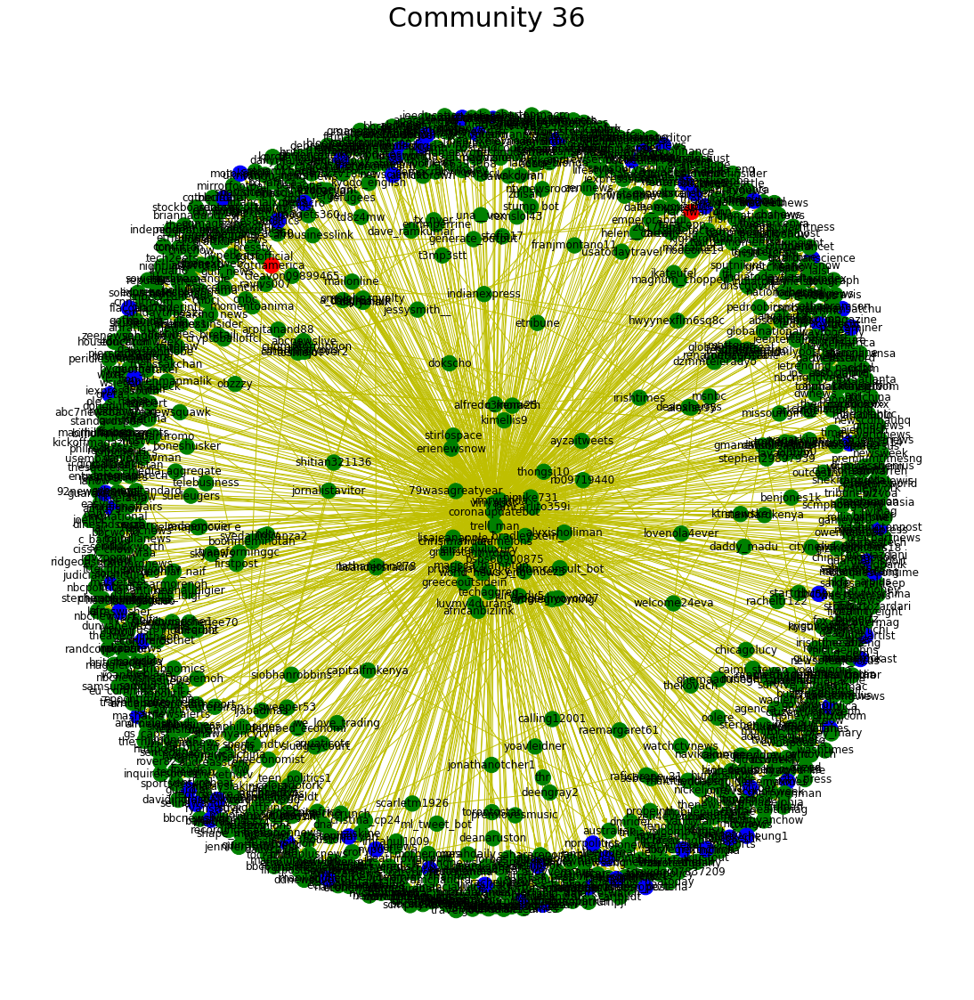

In [212]:
graph_to_print = comm_36_graph
labels = {}    
color_map = ['g']*len(graph_to_print.nodes())
idx = 0
for node in graph_to_print.nodes():
    labels[node] = node
    if node in active_users_bad_l:
        color_map[idx] = 'r'
    elif node in passive_users_good_l:
        color_map[idx] = 'b'
    idx+=1
plt.figure(figsize=(15,15)) 
graph_to_print_relabel = nx.relabel_nodes(graph_to_print, labels)


nx.draw(graph_to_print_relabel, with_labels=True, node_color=color_map, edge_color='y')
plt.title('Community 36', fontsize=30)
#
plt.show()

# Suspended account

In [9]:
suspended = pd.read_csv(path+'suspended.csv')
suspended.head()

,id,screen_name
0,2767590820,ConElMazoDando
1,887508829587488768,thehawk
2,1338073232,onenewsofficial
3,1147654506076725248,Ace135Q
4,250425415,chris19thws


In [10]:
suspended_users = suspended['screen_name']
suspended_users_l = [x.lower() for x in suspended_users]

In [216]:
len(suspended_users_l)

9493

In [218]:
suspended_users_bad = [user for user in suspended_users_l if user in bad_users_array]
len(suspended_users_bad)

9

In [219]:
suspended_users_good = [user for user in suspended_users_l if user in good_users_array]
len(suspended_users_good)

82

In [11]:
d = {'user_screen_name': suspended_users}
suspended_users_df = pd.DataFrame(data=d)
suspended_users_df['user_community'] = suspended_users_df['user_screen_name'].map(louvain)
suspended_users_df.head()

,user_screen_name,user_community
0,ConElMazoDando,0.0
1,thehawk,6.0
2,onenewsofficial,9.0
3,Ace135Q,2.0
4,chris19thws,3.0


In [12]:
len(suspended_users_df.dropna())

7128

In [13]:
suspended_users_df['user_community'].value_counts().head(20)

5.0      1334
2.0       702
0.0       604
6.0       576
1.0       497
19.0      485
14.0      467
15.0      463
9.0       286
10.0      207
23.0      188
11.0      152
3.0       127
21.0       93
32.0       86
27.0       73
25.0       72
108.0      60
7.0        45
48.0       40
Name: user_community, dtype: int64